In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
import matplotlib.pyplot as plt
from matplotlib.widgets import PolygonSelector
import matplotlib.path as mpltPath
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import pprint

from crystals import Crystal
from orix.quaternion import Orientation, Rotation, symmetry
from orix import plot

githubpath = '/home/lheller/Documents/GitHub'
sys.path.append(githubpath)
#[sys.path.append(os.path.join(githubpath, x)) for x in os.listdir(githubpath)]
#
from crystlibs import *
from effelconst  import *
from getphases import *
from ebsdlib  import *
import pyebsd 


In [2]:
%matplotlib widget

# Definition of crystallographical system: structures of austenite and martensite, lattice correspondence, transformation deformation gradients, twinning systems
## Cubic Austenite - parent phase
Austenite lattice matrix $\mathbf{L}^A=\begin{bmatrix}a^A&0&0\\0&a^A&0\\0&0&a^A\end{bmatrix}$ (denoted as LA in the code) is determined by lattice parameter of austenite $a^A$ (denoted as aA in the code).  Austenite lattice matrix converts Miller indexes of austenite lattice directions $\mathbf{m}_{d[uvw]}^A=[u^A,v^A,w^A]^{\sf T}$ into real space coordinates $\mathbf{x}_{d[uvw]}^A=[x^A,y^A,z^A]_{d[uvw]}^{\sf T}=\mathbf{L}^A\ \mathbf{m}_{d[uvw]}^A$.
<br>
Inverse austenite lattice matrix $\mathbf{L}_I^A={\mathbf{L}^A}^{-1}$ (denoted as LIA in the code) converts real space directions into Miller indexes of austenite lattice directions $\mathbf{m}_{d[uvw]}^A=\mathbf{L}_I^A\ \mathbf{x}_{d[uvw]}^A$.<br>
Austenite metric tensor $\mathbf{G}^A={\mathbf{L}^A}^{\sf T}\mathbf{L}^A$ (denoted as GA in the code) enables us to compute the square of the Euclidean norm of austenite lattice direction $||\mathbf{x}_{d[uvw]}^A||^2= {\mathbf{m}_{d[uvw]}^A}^{\sf T}\ \mathbf{G}^A\ \mathbf{m}_{d[uvw]}^A$.
<br><br>
Reciprocal austenite lattice matrix $\mathbf{L}_r^A={{\mathbf{L}^A}^{-1}}^{\sf T}$ (denoted as LrA in the code) converts Miller indexes of austenite lattice planes $\mathbf{m}_{p(hkl)}^A=[h^A,k^A,l^A]^{\sf T}$ into real space coordinates of planes normals $\mathbf{x}_{p(hkl)}^A=[x^A,y^A,z^A]_{p(hkl)}^{\sf T}=\mathbf{L}_r^A\ \mathbf{m}_{p(hkl)}^A$.<br>
Inverse reciprocal austenite lattice matrix $\mathbf{L}_{rI}^A={\mathbf{L}_r^A}^{-1}$ (denoted as LrIA in the code) converts real space plane normals into Miller indexes of austenite lattice planes $\mathbf{m}_{p(hkl)}^A=\mathbf{L}_{rI}^A\ \mathbf{x}_{p(hkl)}^A$.<br>
Austenite reciprocal metric tensor $\mathbf{G}_r^A={\mathbf{G}^A}^{-1}$ (denoted as GrA in the code) enables us to compute the square of the Euclidean norm of interplanar distance $||\mathbf{x}_{p(hkl)}^A||^2= {\mathbf{m}_{p(hkl)}^A}^{\sf T}\ \mathbf{G}_r^A\ \mathbf{m}_{p(hkl)}^A$.
<br>
## Monoclinic martensite - product phase
Martensite lattice matrix $\mathbf{L}^M=\begin{bmatrix}a^M&0&c^M\cos{\beta^M}\\0&b^M&0\\0&0&c^M\sin{\beta^M}\end{bmatrix}$
(denoted as LM in the code) is determined by lattice parameters of monoclinic martensite $a^M$, $b^M$, $c^M$, $\beta^M$ (denoted as aM,bM,cM,betaM in the code).  Martensite lattice matrix converts Miller indexes of martensite lattice directions $\mathbf{m}_{d[uvw]}^M=[u^M,v^M,w^M]^{\sf T}$ into real space coordinates $\mathbf{x}_{d[uvw]}^M=[x^M,y^M,z^M]_{d[uvw]}^{\sf T}=\mathbf{L}^M\ \mathbf{m}_{d[uvw]}^M$.
<br>
Inverse martensite lattice matrix $\mathbf{L}_I^M={\mathbf{L}^M}^{-1}$ (denoted as LIM in the code) converts real space directions into Miller indexes of martensite lattice directions $\mathbf{m}_{d[uvw]}^M=\mathbf{L}_I^M\ \mathbf{x}_{d[uvw]}^M$.<br>
Martensite metric tensor $\mathbf{G}^M={\mathbf{L}^M}^{\sf T}\mathbf{L}^M$ (denoted as GM in the code) enables us to compute the square of the Euclidean norm of martensite lattice direction $||\mathbf{x}_{d[uvw]}^M||^2= {\mathbf{m}_{d[uvw]}^M}^{\sf T}\ \mathbf{G}^M\ \mathbf{m}_{d[uvw]}^M$.
<br><br>
Reciprocal martensite lattice matrix $\mathbf{L}_r^M={{\mathbf{L}^M}^{-1}}^{\sf T}$ (denoted as LrM in the code) converts Miller indexes of martensite lattice planes $\mathbf{m}_{p(hkl)}^M=[h^M,k^M,l^M]^{\sf T}$ into real space coordinates of planes normals $\mathbf{x}_{p(hkl)}^M=[x^M,y^M,z^M]_{p(hkl)}^{\sf T}=\mathbf{L}_r^M\ \mathbf{m}_{p(hkl)}^M$.<br>
Inverse reciprocal martensite lattice matrix $\mathbf{L}_{rI}^M={\mathbf{L}_r^M}^{-1}$ (denoted as LrIM in the code) converts real space plane normals into Miller indexes of martensite lattice planes $\mathbf{m}_{p(hkl)}^M=\mathbf{L}_{rI}^M\ \mathbf{x}_{p(hkl)}^M$.<br>
Martensite reciprocal metric tensor $\mathbf{G}_r^M={\mathbf{G}^M}^{-1}$ (denoted as GrM in the code) enables us to compute the square of the Euclidean norm of interplanar distance $||\mathbf{x}_{p(hkl)}^M||^2= {\mathbf{m}_{p(hkl)}^M}^{\sf T}\ \mathbf{G}_r^M\ \mathbf{m}_{p(hkl)}^M$.
# Lattice correspondence
Corespondance matrices for directions $\mathbf{C}_d^{M\xrightarrow i A}$ (denoted as Cd in the code) mapping martensite lattice directions $\mathbf{m}_{d[uvw]}^M$ into austenite ones $\mathbf{m}_{d[u_iv_iw_i]}^A$ and inversely using matrices $\mathbf{C}_d^{A\xrightarrow i M}={\mathbf{C}_d^{M\xrightarrow i A}}^{-1}$ (denoted as CId in the code), where $i=1\ldots 12$ denotes correspondence variants.<br>
similarly, for lattice plane normals. Corespondance matrices for planes $\mathbf{C}_p^{M\xrightarrow i A}$ (denoted as Cp in the code) mapping martensite lattice directions $\mathbf{m}_{p(hkl)}^M$ into austenite ones $\mathbf{m}_{p(h_ik_il_i)}^A$ and inversely using matrices $\mathbf{C}_p^{A\xrightarrow i M}={\mathbf{C}_p^{M\xrightarrow i A}}^{-1}$ (denoted as CIp in the code), where $i=1\ldots 12$ denotes correspondence variants.

In [3]:
# -----------------------------------------------------------------------------
#  THE RECIPE  (edit here; everything downstream reads from it)
# -----------------------------------------------------------------------------
RECIPE = dict(
    # ---- data + crystallography (rebuilds dataEBSD; raw pixels re-read) ------
    filename = '/home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan.ang',  # source .oh5 scan
    cif_A    = '/home/lheller/Documents/diffraction/cifs/NiTi - pm3m.cif',    # austenite CIF (cubic Pm-3m)
    cif_M    = '/home/lheller/Documents/diffraction/cifs/NiTiB19p.cif',       # martensite CIF (B19' monoclinic)
    aA = 3.015,                          # austenite lattice parameter a [Å] (Bhattacharya 2003)
    aM = 2.889, bM = 4.12, cM = 4.622,   # martensite lattice parameters a,b,c [Å]
    betaM = 96.8 * np.pi / 180,          # martensite monoclinic angle beta [rad] (96.8°)
    phaseID = {'A': 2, 'M': 3},          # map phase name -> phase id in the .oh5 data
    or_d    = [1, 0, 0],                 # sample direction passed to select_rois(d=...)
    roiID   = 1,                         # which ROI (region of interest) to analyse
    roi_verts = None,                    # stored ROI polygon vertices (filled by
                                         # finalize_rois); None => select interactively once

    # ---- clustering (MisorientationClustering) ------------------------------
    clustering = dict(
        ang_thr=2.5,                     # grain-boundary misorientation threshold [deg]
        dmax=3,                          # max neighbour distance searched when clustering [px]
        minidxs=[10, 3],                 # min cluster size [px] per phase (e.g. [austenite, martensite])
        distance=1,                      # neighbour step used for pairwise misorientation [px]
        perimeteronly=[False, False],     # per phase: cluster on perimeter pixels only? (A=no, M=yes)
        distance_convention="OIM"),      # neighbour/distance convention ("OIM" grid convention)

    # ---- KAM / GND (KamGND) -------------------------------------------------
    kamgnd = dict(
        distance=2,                      # neighbour shell radius for KAM/GND [px]
        perimeteronly=False,             # use all pixels (not just cluster perimeters)
        maxmis=10),                      # max misorientation counted in KAM [deg] (caps outliers)

    # ---- lamellar-cluster identification (identify_lamellar_clusters) -------
    lamellar = dict(
        phase_id=2,                      # phase to test for lamellar shape (2 = martensite)
        min_aspect_ratio=10,             # min length/width for a cluster to count as a lamella
        use_hexagonal=True,              # treat scan grid as hexagonal in the shape analysis
        use_sklearn=True,                # use scikit-learn PCA for the elongation fit
        show_progress=True,              # print a progress bar
        min_width_threshold=0,           # min lamella width [px] (0 = no lower bound)
        min_pixesl_threshold=10),        # min pixel count for a cluster to be considered

    # ---- physical reconstruction (merge fragmented grains / lamellae) -------
    reconstruct_grains   = dict(
        threshold_deg=5.0),              # merge austenite fragments if disorientation < this [deg]
    reconstruct_lamellas = dict(
        threshold_deg=5.0,               # merge martensite fragments if disorientation < this [deg]
        angle_tol_deg=8.0,               # max angle between fragment principal directions [deg]
        collinearity_tol=1.0,            # max perpendicular offset, in units of mean lamella width
        gap_tol_factor=8.0),             # max end-to-end gap along the lamella, in units of mean width

    # ---- hierarchy + meeting pairs ------------------------------------------
    hierarchy = dict(
        filter_lamellar_to_semi_rois=True,  # split each lamella into its two long-side semi-ROIs
        semi_roi_params=None,            # semi-ROI geometry overrides (None = defaults)
        min_aspect_ratio=-0.1),          # aspect-ratio floor for inclusion (-0.1 = keep all)
    meeting   = dict(
        tip_distance_threshold=15.0),    # two lamella tips are a "meeting pair" if within this [px]

    # ---- downstream analysis params (report / OR / variant compatibility) ---
    params = dict(
        frag_merge_deg=2.0,              # austenite fragment-merge threshold used in the report [deg]
        lamella_merge_deg=2.0,           # martensite fragment-merge threshold used in the report [deg]
        oop_flag_deg=20.0,               # flag habit planes whose out-of-plane angle exceeds this [deg]
        or_preserved_deg=3.0,            # OR-residual threshold for "OR preserved" across a boundary [deg]
        tip_distance_px=15.0,            # tip-proximity threshold for boundary meeting pairs [px]
        ma_threshold_deg=2.0),           # martensite disorientation to group variants within a grain [deg]
)


# Loading EBSD and Selecting ROIs

Reading file "/home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.20 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.20 s


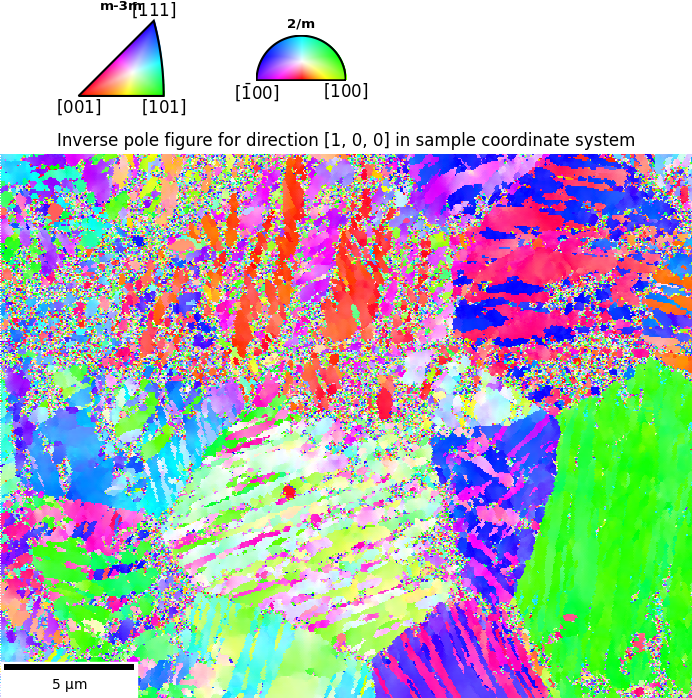

Click on the figure to create a polygon.
Press the 'esc' key to start a new polygon.
Try holding the 'shift' key to move all of the vertices.
Try holding the 'ctrl' key to move a single vertex.

>>> Draw ROI polygon(s) in the figure, then run:
>>>     finalize_rois(dataEBSD, RECIPE)
>>> (this stores the masks and saves the polygons into the recipe)



In [4]:

# -----------------------------------------------------------------------------
#  FULL PIPELINE (fresh analysis), all parameters read from `recipe`
# -----------------------------------------------------------------------------
recipe=RECIPE
verbose=True
checkpoint_path='auto'
"""Run the full analysis from a recipe.

checkpoint_path:
    None       -> do not save a checkpoint (default),
    'auto'     -> save to "<oh5 stem>_roi<ID>_checkpoint.h5" next to nothing
                    in particular (current dir); name derived from the recipe,
    <path str> -> save to that path.
"""
roiID = recipe['roiID']
pA, pM = recipe['phaseID']['A'], recipe['phaseID']['M']

# --- data + crystallography ---------------------------------------------
dataEBSD = build_dataEBSD(recipe, interactive=True)


In [5]:
finalize_rois(dataEBSD, RECIPE)

stored 1 ROI polygon(s) in recipe['roi_verts']


Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.11 s


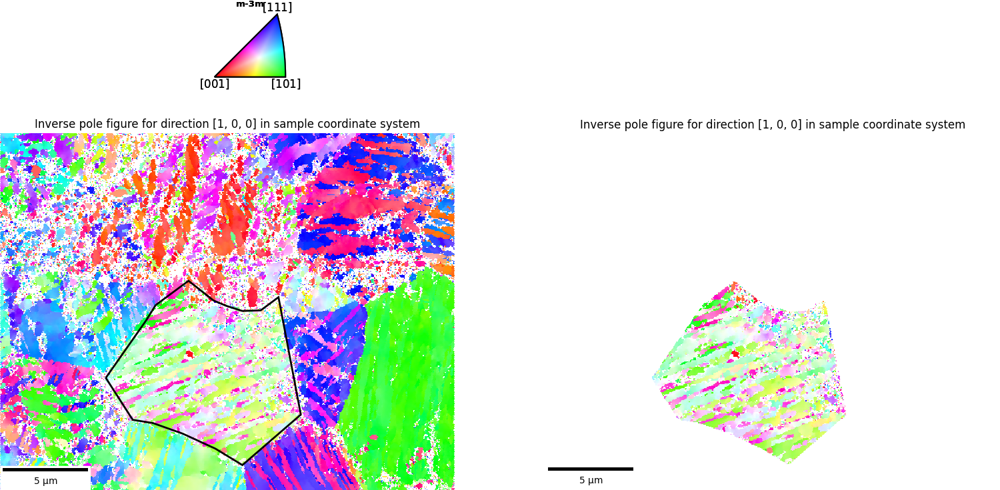

In [6]:
roi=4
fig,AX = plt.subplots(1,2,figsize=(15,10))
fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],phase='A')
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
fig,ax = dataEBSD.plot_IPF(ax=AX[1],fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='A',globalScale=True)

Plotting Inverse Pole Figure... 0.13 s
Plotting Inverse Pole Figure... 0.16 s


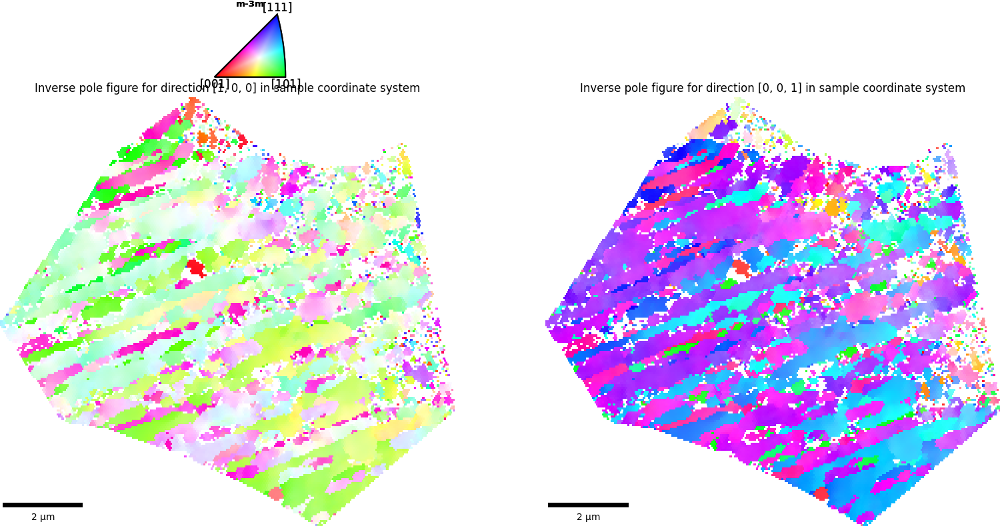

In [7]:
roi=4
fig,AX = plt.subplots(1,2,figsize=(15,10))
fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='A',globalScale=False)
fig,ax = dataEBSD.plot_IPF(ax=AX[1],fig=fig,d=[0,0,1],roi=recipe['roiID'],phase='A',globalScale=False)
#fig,AX = plt.subplots(1,2,figsize=(15,10))
#fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='M',globalScale=False)
#fig,ax = dataEBSD.plot_IPF(ax=AX[1],fig=fig,d=[0,0,1],roi=recipe['roiID'],phase='M',globalScale=False)

# Clustering

In [8]:
# --- clustering ----------------------------------------------------------
c = recipe['clustering']
alg = MisorientationClustering(
    ang_thr=c['ang_thr'], dmax=c['dmax'], minidxs=c['minidxs'], roi=roiID,
    distance=c['distance'], perimeteronly=c['perimeteronly'],
    distance_convention=c['distance_convention'])
clustering_result = alg.fit(dataEBSD)
clustering_result = clustering_result.symmetrize_clusters(
    cluster_ids='all', phase='A',
    return_clustering_result=True
)
dataEBSD.set_rois2d(recipe['roiID'])
clustering_result.update_grid_2d()


Clustering 2 phases sequentially...
  Phase 2... 235 clusters
  Phase 3... 122 clusters
Total: 357 clusters across all phases


Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.09 s


(None, <Axes: >)

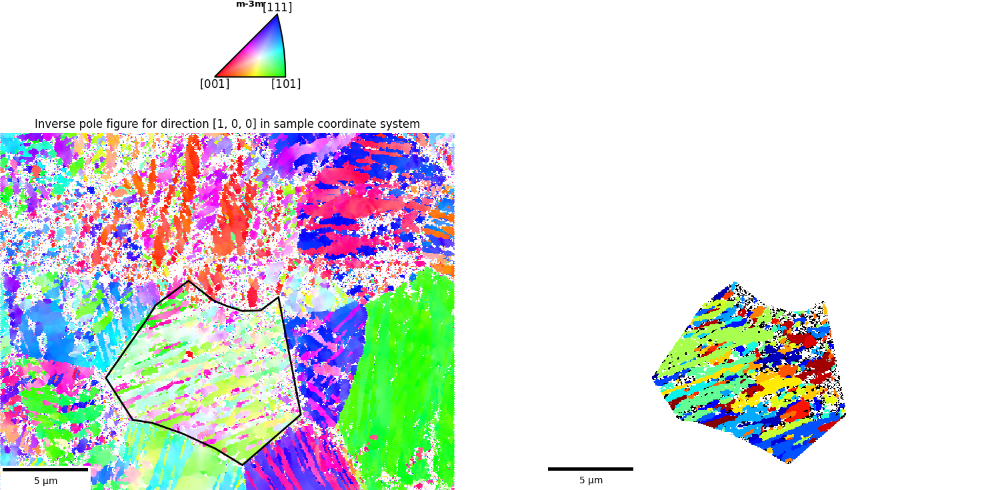

In [9]:
fig,AX = plt.subplots(1,2,figsize=(15,10))
fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],phase='A')
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
#fig,AX = plt.subplots(1,1,figsize=(10,8))
visualizer = EBSDVisualizer()
visualizer.plotClusters(clustering_result, ax=AX[1], globalScale=True, tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster')

# Get common lattice direction of clusters

 Cluster   Pixels  Mean (deg)  Std (deg)  Max (deg)
----------------------------------------------------
      17     2735       3.145      2.064     10.299
     100     1407       1.797      1.086      6.766
     207     1315       2.604      1.309      6.589
     189      902       2.289      1.222      6.329
     135      833       2.255      1.103      5.192
      98      488       3.430      1.500      9.157
      82      459       1.983      1.017      5.603
     116      381       4.449      2.530      9.562
     146      367       2.050      1.159      5.257
     176      357       1.515      0.909      5.315
     214      355       2.485      1.068      4.987
     194      242       1.807      0.671      3.315
     211      207       1.512      0.799      3.877
     118      204       1.413      0.879      4.405
     124      204       1.606      1.161      4.122
     155      202       2.634      1.877      6.496
     126      195       2.531      1.188      5.830
      15   

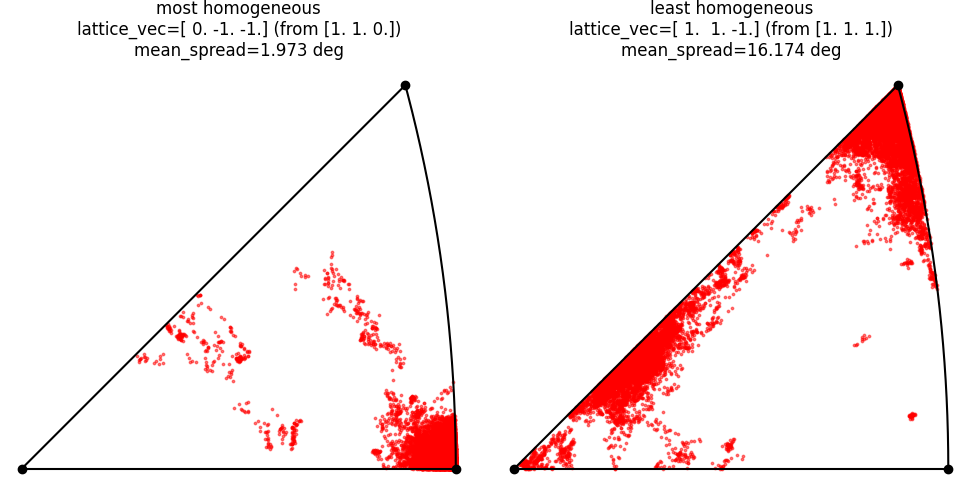

In [10]:
summary = clustering_result.print_pixel_to_average_misorientation_summary(cluster_ids=None,sort_by='n_pixels')
cluster1 = list(summary.keys())[0]
results = clustering_result.evaluate_lattice_direction_homogeneity(
    anchor_cluster_id=cluster1, lattice_vec=[[1,0,0],[1, 1, 0],[1,1,1]], phase='A',
    cluster_ids='all', units='deg', print_result=True, plot_result=True
)
zone_axis = results[0]['lattice_vec']
print("")
print(f"The shared lattice direction is probably {zone_axis}")


Plotting Inverse Pole Figure... 0.12 s


(<Figure size 900x800 with 2 Axes>,
 <Axes: title={'center': 'Inverse pole figure for direction [-0.44730738  0.89312663 -0.04733845] in sample coordinate system'}>)

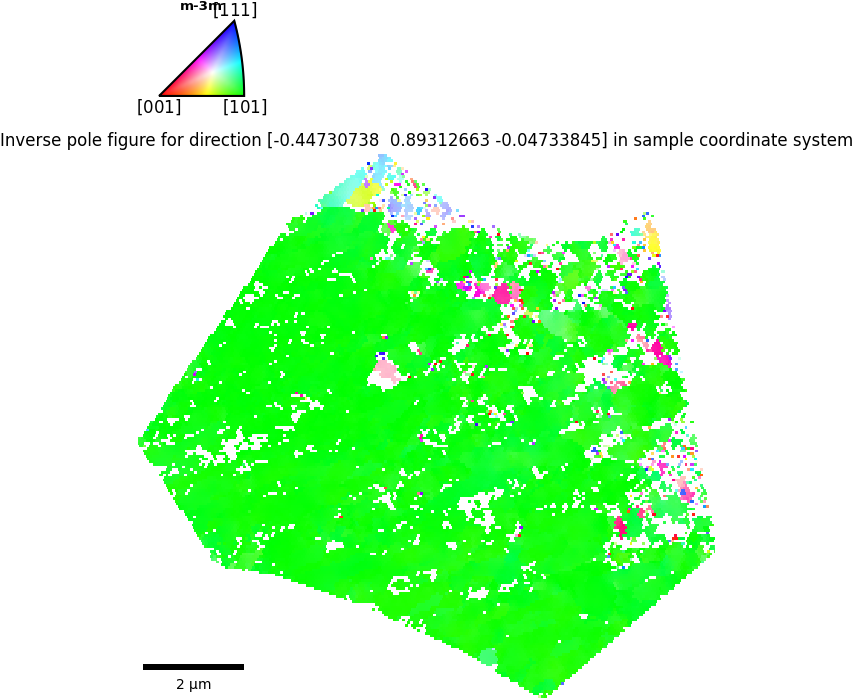

In [11]:
phase = 'A'
symops = clustering_result.data.phases[phase]['symops']

cartesian_vec = clustering_result.data.phases[phase]['L'].dot(zone_axis)
cartesian_vec = clustering_result.data.phases[phase]['L'].dot(zone_axis)
cartesian_vec/=np.linalg.norm(cartesian_vec)
d = clustering_result.get_cluster_pixel_orientations(cluster_id=cluster1)['avg_mat'].T.dot(cartesian_vec)
visualizer = EBSDVisualizer()
visualizer.plotClusters(clustering_result,d=d, tiling=None, roi=recipe['roiID'], phase=phase,color_by='ipf',globalScale=False)

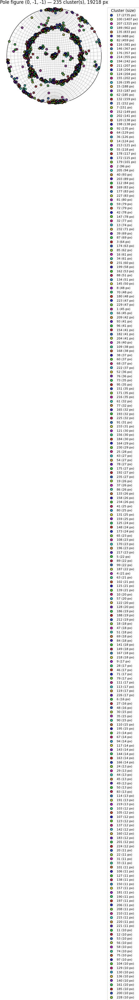

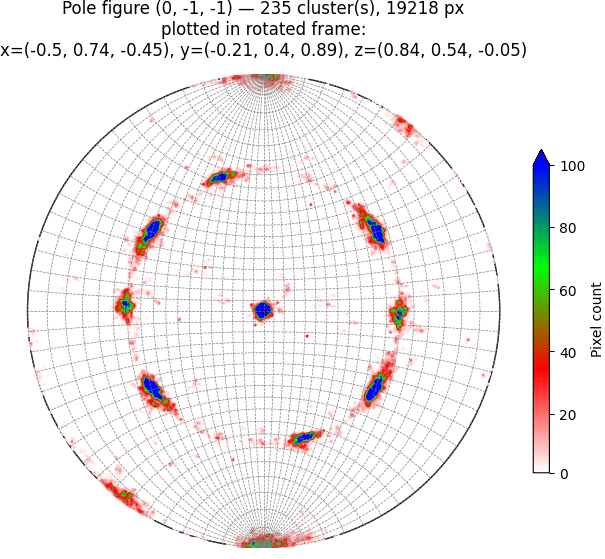

In [81]:
sample_transform = clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)

fig, ax = clustering_result.plot_cluster_pole_figure(cluster_id='all', phase='A', uvw=zone_axis, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=False,hemi='upper',sample_transform=sample_transform)
fig, ax, results = clustering_result.plot_cluster_pole_figure(cluster_id='all', phase='A', uvw=zone_axis, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 



# Merge clusters by orientation

Plotting Inverse Pole Figure... 0.28 s
Plotting Inverse Pole Figure... 0.18 s


Text(0.5, 1.0, 'After merging')

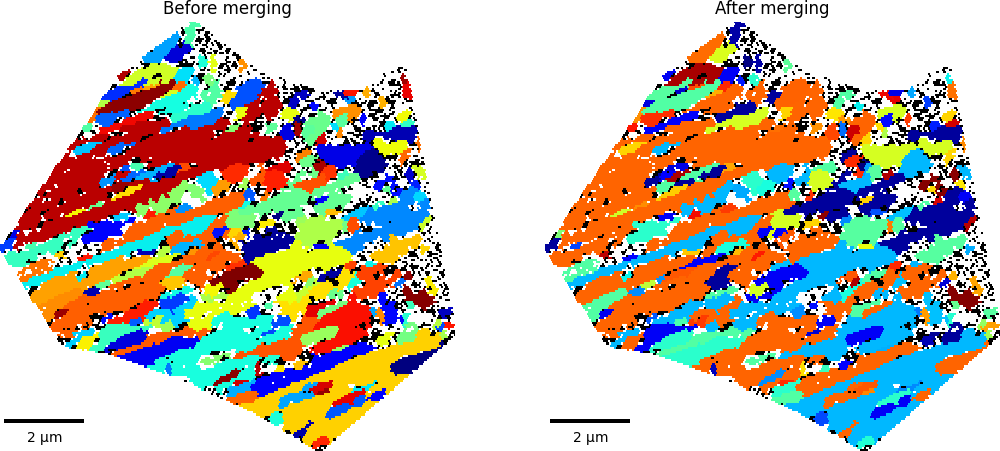

In [13]:
merged_clustering_result, merge_groups_all  = clustering_result.merge_clusters_by_orientation(threshold_deg=5.0, phase='A', min_size=20)
fig,AX = plt.subplots(1,2,figsize=(10,7))
visualizer = EBSDVisualizer()
visualizer.plotClusters(clustering_result, ax=AX[0], tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[0].set_title("Before merging")
visualizer = EBSDVisualizer()
visualizer.plotClusters(merged_clustering_result, ax=AX[1], tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[1].set_title("After merging")

In [14]:
merged_roots = [r for r, frags in merge_groups_all['A'].items() if len(frags) > 1]
all_cluster_ids = list(merged_clustering_result.labels_by_phase['A'])
summary = merged_clustering_result.print_pixel_to_average_misorientation_summary(cluster_ids=merged_roots,sort_by='n_pixels')

 Cluster   Pixels  Mean (deg)  Std (deg)  Max (deg)
----------------------------------------------------
      16     7321       3.023      1.648     10.342
      61     3886       2.843      1.486      8.928
      25     1328       2.903      1.369      9.360
      15      886       2.318      0.916      6.503
      34      653       3.178      1.568      8.465
       8      620       1.986      1.006      5.193
      10      615       1.831      0.812      4.625
      13      543       2.742      1.378      7.086
       7      176       4.314      2.296     10.328
     109      170       2.564      0.657      4.477
      14      166       1.529      0.811      4.536
      37      151       1.866      0.757      5.716
      42      148       1.981      0.618      3.328
      88      134       2.540      0.889      4.694
      93      124       1.148      0.400      2.785
     131      124       1.889      0.848      4.245
      76      119       1.809      0.548      3.337
     170   

In [15]:

merged_clustering_result = merged_clustering_result.symmetrize_clusters(
    cluster_ids='all', phase='A', reference_cluster_id=merged_roots[0],
    return_clustering_result=True
)

In [40]:
# returned matches sorted by size (largest reconstructed grains first)
pairs_results, matches = merged_clustering_result.map_twin_relationships(
    phase='A', system='NiTi', modes=['115','114','113','112','111'], tol_deg=5.0, min_size=100,
    sort_by='size',print_result=True
)


   #  Cluster A     Px A  Cluster B     Px B     Mode  Condition    Shear   Axis dev  Angle dev  Match
------------------------------------------------------------------------------------------------------------
   0         16     7321         61     3886      114     K1_180   38.94°      1.01°      0.18°    yes
   1         16     7321         34      653      114     K1_180   38.94°      1.84°      0.91°    yes
   2         10      615         16     7321      115     K1_180   31.59°      0.70°      0.43°    yes
   3          7      176         16     7321      115     K1_180   31.59°      1.87°      0.91°    yes
   4         16     7321        109      170      114     K1_180   38.94°      1.64°      0.15°    yes
   5         16     7321         93      124      112     K1_180   70.53°      1.62°      0.33°    yes
   6         16     7321        131      124      113   eta1_180   50.48°      1.86°      0.82°    yes
   7         25     1328         61     3886      115   eta1_180   

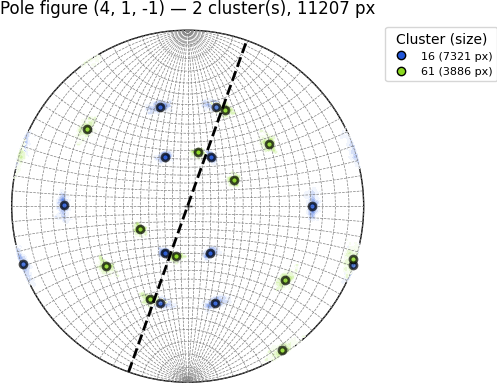

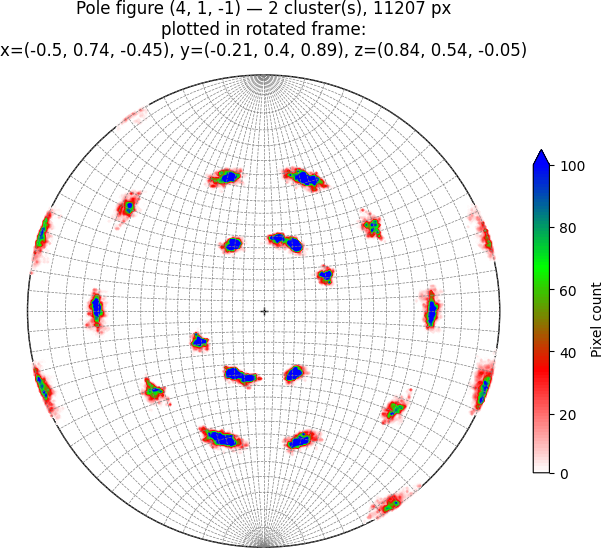

In [86]:
#sample_transform = merged_clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)
idx = 0
cluster_ids = [matches[idx]['cluster_a'], matches[idx]['cluster_b']]
G1 = merged_clustering_result.avg_orientations[cluster_a_id]
G2 = merged_clustering_result.avg_orientations[cluster_b_id]
T = m['T']  # the symop found by the T-loop, applied to G1's side only

n1 = m['twin_elements']['n1_a']   # K1's Cartesian normal, already the matched variant
uvw = m['twin_elements']['K1_a']  # Miller indices, same variant (fine as-is: phase A is cubic,
                                   # so Miller ~ Cartesian direction up to scale; plot_cluster_pole_figure
                                   # doesn't apply the phase's L matrix to uvw itself)

# ---- sample-frame pole, computed two ways: from cluster_a (needs T),
#      and from cluster_b (no T needed) -- these should nearly coincide,
#      since that coincidence is exactly what the twin match means
normal = sample_transform @ G1.T.dot(T.dot(n1))


equalarea=False
fig, ax = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=uvw, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=equalarea,hemi='upper',sample_transform=sample_transform)

if not equalarea:
    trace = stereoprojection_planes(normal,arclength=360.,iniangle=0.,hemisphere="upper")
else:
    trace = equalarea_planes(normal,arclength=360.,iniangle=0.,hemisphere="upper")

ax.plot(trace[0,:], trace[1,:], 'k--', lw=2, label='K1 plane trace')

fig, ax, results = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=uvw, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 

Plotting Inverse Pole Figure... 0.20 s
Plotting Inverse Pole Figure... 0.26 s


Text(0.5, 1.0, 'Selected clusters')

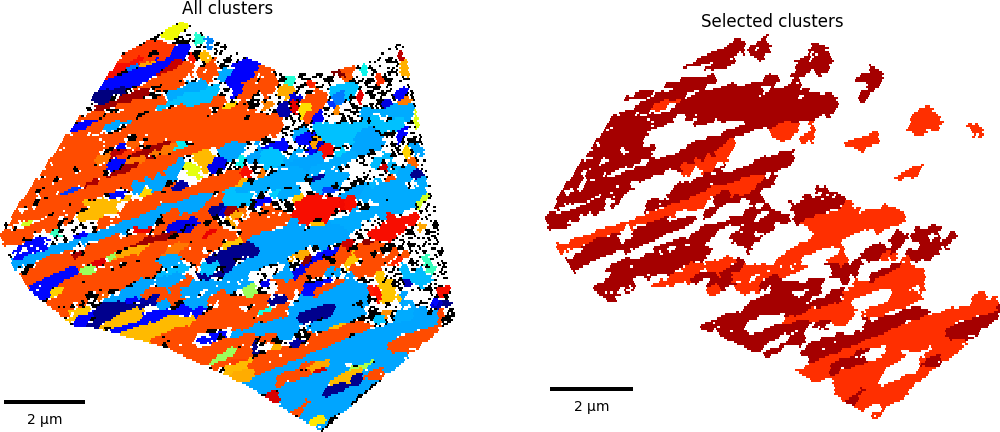

In [81]:
fig,AX = plt.subplots(1,2,figsize=(10,7))
visualizer = EBSDVisualizer()
visualizer.plotClusters(merged_clustering_result, ax=AX[0], tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[0].set_title("All clusters")
visualizer = EBSDVisualizer()
visualizer.plotClusters(merged_clustering_result, ax=AX[1], cluster_id = cluster_ids, tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[1].set_title("Selected clusters")


In [56]:
idxs = [0,4]
cluster_ids = [merged_roots[idx] for idx in idxs]
result = merged_clustering_result.check_twin_relationship(
    cluster_a=cluster_ids[0], cluster_b=cluster_ids[1], system='NiTi', mode='114', tol_deg=5.0
)
print(result)


{'cluster_a': 11, 'cluster_b': 29, 'system': 'NiTi', 'mode': '114', 'is_match': True, 'best_condition': 'K2_shear', 'axis_dev_deg': 2.9030631122757358, 'angle_dev_deg': np.float64(3.251028894250581), 'checks': {'K1_180': {'axis_dev_deg': 30.654317622097174, 'angle_dev_deg': np.float64(137.806529836768), 'is_match': False, 'variant_idx': 1}, 'eta1_180': {'axis_dev_deg': 18.395635465766738, 'angle_dev_deg': np.float64(137.806529836768), 'is_match': False, 'variant_idx': 2}, 'K2_shear': {'axis_dev_deg': 2.9030631122757358, 'angle_dev_deg': np.float64(3.251028894250581), 'is_match': np.True_, 'variant_idx': 0}}, 'axis': array([ 0.0219029 ,  0.73848952, -0.67390911]), 'angle_deg': np.float64(42.193470163232)}


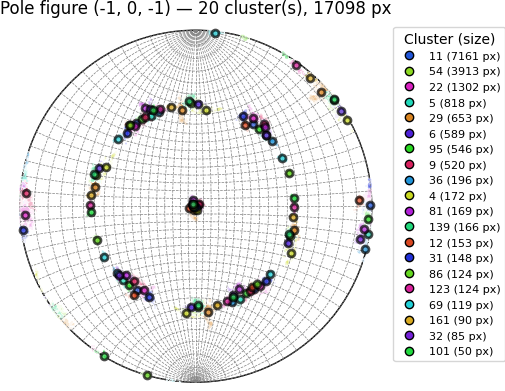

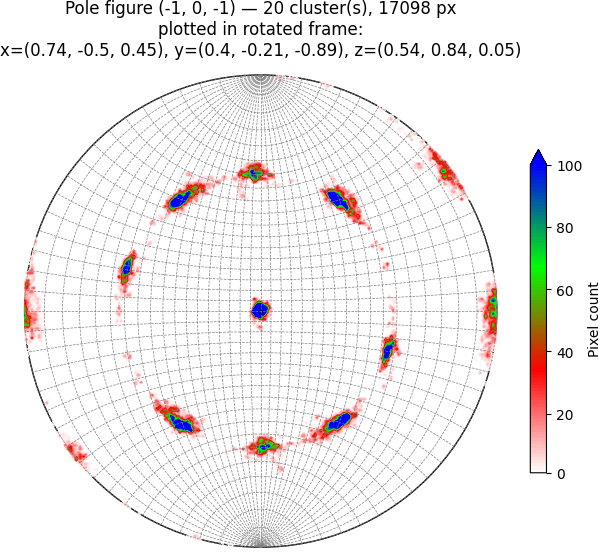

In [18]:
#sample_transform = merged_clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)

fig, ax = merged_clustering_result.plot_cluster_pole_figure(cluster_id=merged_roots, phase='A', uvw=zone_axis, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=False,hemi='upper',sample_transform=sample_transform)
fig, ax, results = merged_clustering_result.plot_cluster_pole_figure(cluster_id=merged_roots, phase='A', uvw=zone_axis, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 

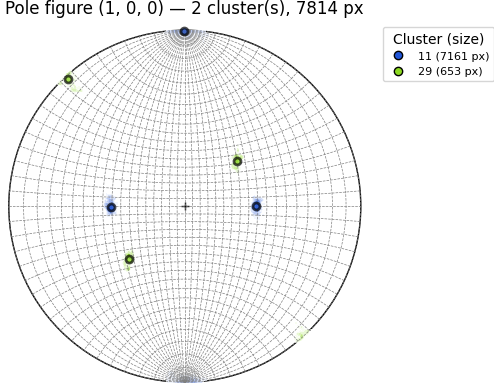

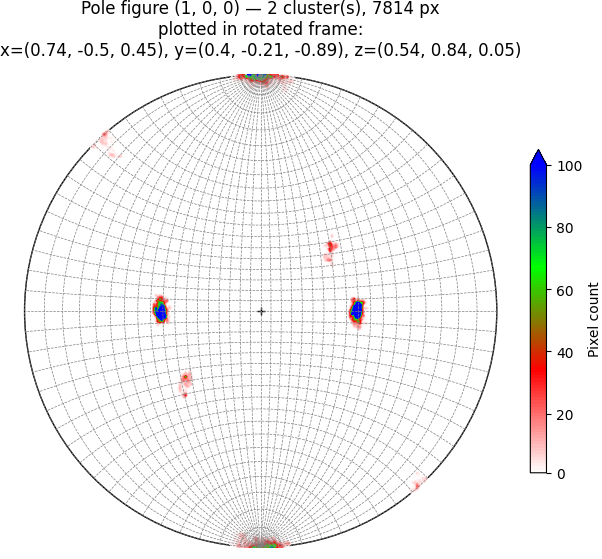

In [46]:
#sample_transform = merged_clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)
idxs = [0,4]
cluster_ids = [merged_roots[idx] for idx in idxs]
uvw = [1,0,0]
fig, ax = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=uvw, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=False,hemi='upper',sample_transform=sample_transform)
fig, ax, results = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=uvw, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 

# GND, KAM

In [82]:
# --- KAM / GND -----------------------------------------------------------
k = recipe['kamgnd']
kg = KamGND(distance=k['distance'], perimeteronly=k['perimeteronly'],
            maxmis=k['maxmis'], roi=roiID, cluster_id=None)
clustering_result = kg.computeKAM(clustering_result)
clustering_result = kg.computeGND(clustering_result)

Calculating misorientations for 143909 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 7.38 s
Calculating misorientations for 34378 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 0.41 s
Calculating misorientations for 143909 points for 6 neighbors [1, 2, 3, 4, 5, 6] in 1.84 s
Calculating misorientations for 143909 points for 12 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] in 4.19 s
Calculating misorientations for 143909 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 6.87 s
Calculating misorientations for 143909 points for 24 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24] in 7.73 s
Calculating misorientations for 143909 points for 30 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30] in 12.39 s
Calculating misorientations for 34378 p